In [653]:
import pandas as pd
import numpy as np
import sklearn
import pydotplus

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.model_selection import cross_val_score
import sklearn.ensemble as skens

import sklearn.metrics as skmetric
from sklearn.metrics import roc_auc_score, roc_curve

# models
from sklearn.linear_model import LogisticRegression
import sklearn.naive_bayes as sknb
import sklearn.tree as sktree
from sklearn.neural_network import MLPClassifier
from sklearn.decomposition import LatentDirichletAllocation, NMF
from sklearn.naive_bayes import BernoulliNB 
import lime
import lime.lime_tabular

# plotting
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style='white', color_codes=True, font_scale=1.3)

import sklearn.externals.six as sksix
import IPython.display as ipd

import os

# Filter all warnings.
import warnings
warnings.filterwarnings('ignore')


from __future__ import print_function

In [654]:
# aa_test1= pd.read_csv("data/AA/AA_train1.data")
COLUMNS_COUNT = 82
# # read first `COLUMNS_COUNT` lines to serve as a header

In [655]:
with open("public_data_1/mimic_synthetic_feat.name") as f:
    header_data = f.readlines()  

In [656]:
header_data = [line.strip("\n") for line in header_data]

In [657]:
read_csv = pd.read_csv('public_data_1/mimic_synthetic_train.data', header=None, names=header_data, delim_whitespace=True, 
                      skip_blank_lines=True,  error_bad_lines=False)

In [658]:
# figuring out if data is cat or bin
with open('public_data_1/mimic_synthetic_feat.type') as f:
    cat_bin_index = f.readlines()

In [659]:
cat_bin_index = [line.strip("\n") for line in cat_bin_index]

In [660]:
cat_gender_lst = []
for i, cat in enumerate(cat_bin_index):
    if cat == "Categorical":
        cat_gender_lst.append(i)    

In [661]:
cat_gender_lst

[2, 3, 4, 5, 6, 7, 8, 59]

In [662]:
cat_gender_lst.append(9)

In [663]:
cat_gender_lst

[2, 3, 4, 5, 6, 7, 8, 59, 9]

In [664]:
read_csv.iloc[:, cat_gender_lst]

,ADMITTIME,DISCHTIME,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,ICU,GENDER
0,2128-05-15_23:42:00,2132-07-23_15:00:00,Private,ENGL,CATHOLIC,DIVORCED,WHITE,SICU,F
1,2134-03-17_03:59:00,2113-03-06_12:05:00,Private,ENGL,UNOBTAINABLE,SINGLE,WHITE,CCU,M
2,2164-04-05_17:32:00,2180-09-20_16:30:00,Medicaid,SPAN,CATHOLIC,WIDOWED,OTHER,MICU,M
3,2102-09-08_00:58:00,2166-06-26_15:30:00,Medicare,ENGL,NOT_SPECIFIED,MARRIED,WHITE,CCU,M
4,2163-08-06_12:07:00,2147-01-14_18:40:00,Medicare,ENGL,UNOBTAINABLE,MARRIED,UNKNOWN/NOT_SPECIFIED,MICU,F
5,2147-08-30_19:51:00,2136-11-19_18:53:00,Medicare,ENGL,CATHOLIC,MARRIED,WHITE,TSICU,F
6,2144-04-26_22:49:00,2199-06-24_10:49:00,Medicare,ENGL,UNOBTAINABLE,MARRIED,UNKNOWN/NOT_SPECIFIED,TSICU,M
7,2194-04-12_01:19:00,2118-09-30_19:00:00,Medicare,ENGL,CATHOLIC,WIDOWED,WHITE,CSRU,F
8,2159-10-13_23:08:00,2179-09-14_15:40:00,Medicare,ENGL,CATHOLIC,SINGLE,WHITE,CSRU,M
9,2119-08-01_07:15:00,2141-09-26_13:15:00,Medicare,ENGL,JEWISH,MARRIED,WHITE,CCU,M


In [665]:
# making dummies out of everything from cat_gender_lst except time ones
dummy_columns_lst = []
for i in cat_gender_lst[2:]:
    dummy_columns_lst.append(read_csv.columns[i])

In [666]:
dummy_columns_lst

['INSURANCE',
 'LANGUAGE',
 'RELIGION',
 'MARITAL_STATUS',
 'ETHNICITY',
 'ICU',
 'GENDER']

In [667]:
# for i, t in enumerate(read_csv.GENDER):
#     if t == "82":
#   if t == "81"    
#         print((i,t))

In [668]:
# dropping (32539, '81' and (53191, '82')

##### Need to combine x and y data, and drop same rows in each

In [669]:
# adding the y data as the last column in csv.
read_csv["y_data"] = pd.read_csv("public_data_1/mimic_synthetic_train.solution", header=None)

In [670]:
read_csv.head()

,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,GENDER,...,Othereyedx,Otitismedia,Dizziness,Othereardx,Othnervdx,Hrtvalvedx,Carditis,HTN,Htncomplicn,y_data
0,45524,108398,2128-05-15_23:42:00,2132-07-23_15:00:00,Private,ENGL,CATHOLIC,DIVORCED,WHITE,F,...,0,0,0,0.0,0.0,0,0,0,0.0,0
1,50520,186416,2134-03-17_03:59:00,2113-03-06_12:05:00,Private,ENGL,UNOBTAINABLE,SINGLE,WHITE,M,...,0,0,0,0.0,0.0,0,0,0,1.0,0
2,17956,126413,2164-04-05_17:32:00,2180-09-20_16:30:00,Medicaid,SPAN,CATHOLIC,WIDOWED,OTHER,M,...,0,0,0,0.0,0.0,0,0,0,0.0,0
3,90258,109355,2102-09-08_00:58:00,2166-06-26_15:30:00,Medicare,ENGL,NOT_SPECIFIED,MARRIED,WHITE,M,...,0,0,0,0.0,0.0,0,0,1,0.0,0
4,25159,123784,2163-08-06_12:07:00,2147-01-14_18:40:00,Medicare,ENGL,UNOBTAINABLE,MARRIED,UNKNOWN/NOT_SPECIFIED,F,...,0,0,0,0.0,0.0,0,0,0,0.0,0


In [671]:
read_csv.drop([32539,53191], inplace=True)

In [672]:
for i in read_csv.columns:
#     if True in pd.isna(read_csv2[i]):
    if pd.isna(read_csv[i]).sum() > 0:
        print(i, pd.isna(read_csv[i]).sum())    

Htncomplicn 11


There are 13 rows that contain na, all in htncomplicn column. 

only one column has na's and there are only 11 of them (htncomplicn)

that means this data is pretty clean

Drop NA's!

In [673]:
read_csv.dropna(inplace=True)

In [674]:
read_csv = read_csv.reindex()

##### Creating Y Data

In [675]:
y_data = pd.DataFrame(read_csv.y_data)

##### Dropping y_data column from read_csv df

In [676]:
# and dropping y_data column from read_csv df
read_csv.drop(columns=["y_data"], axis=1, inplace=True)

In [677]:
read_csv.head()

,SUBJECT_ID,HADM_ID,ADMITTIME,DISCHTIME,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,GENDER,...,Eyeinfectn,Othereyedx,Otitismedia,Dizziness,Othereardx,Othnervdx,Hrtvalvedx,Carditis,HTN,Htncomplicn
0,45524,108398,2128-05-15_23:42:00,2132-07-23_15:00:00,Private,ENGL,CATHOLIC,DIVORCED,WHITE,F,...,0,0,0,0,0.0,0.0,0,0,0,0.0
1,50520,186416,2134-03-17_03:59:00,2113-03-06_12:05:00,Private,ENGL,UNOBTAINABLE,SINGLE,WHITE,M,...,0,0,0,0,0.0,0.0,0,0,0,1.0
2,17956,126413,2164-04-05_17:32:00,2180-09-20_16:30:00,Medicaid,SPAN,CATHOLIC,WIDOWED,OTHER,M,...,0,0,0,0,0.0,0.0,0,0,0,0.0
3,90258,109355,2102-09-08_00:58:00,2166-06-26_15:30:00,Medicare,ENGL,NOT_SPECIFIED,MARRIED,WHITE,M,...,0,0,0,0,0.0,0.0,0,0,1,0.0
4,25159,123784,2163-08-06_12:07:00,2147-01-14_18:40:00,Medicare,ENGL,UNOBTAINABLE,MARRIED,UNKNOWN/NOT_SPECIFIED,F,...,0,0,0,0,0.0,0.0,0,0,0,0.0


In [678]:
x_data.head()

,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,GENDER,AGE,HR_MIN_DAY1,HR_MAX_DAY1,HR_MEAN_DAY1,...,Eyeinfectn,Othereyedx,Otitismedia,Dizziness,Othereardx,Othnervdx,Hrtvalvedx,Carditis,HTN,Htncomplicn
0,Private,ENGL,CATHOLIC,DIVORCED,WHITE,F,21.0,57.207630,108.704030,70.841980,...,0,0,0,0,0.0,0.0,0,0,0,0.0
1,Private,ENGL,UNOBTAINABLE,SINGLE,WHITE,M,39.0,79.331400,121.138664,96.915726,...,0,0,0,0,0.0,0.0,0,0,0,1.0
2,Medicaid,SPAN,CATHOLIC,WIDOWED,OTHER,M,40.0,118.230290,175.175430,140.936700,...,0,0,0,0,0.0,0.0,0,0,0,0.0
3,Medicare,ENGL,NOT_SPECIFIED,MARRIED,WHITE,M,75.0,83.780380,89.188980,86.051155,...,0,0,0,0,0.0,0.0,0,0,1,0.0
4,Medicare,ENGL,UNOBTAINABLE,MARRIED,UNKNOWN/NOT_SPECIFIED,F,55.0,60.878613,105.637500,80.616840,...,0,0,0,0,0.0,0.0,0,0,0,0.0


In [679]:
x_data = read_csv[read_csv.columns[4:]].copy()

In [680]:
x_data_with_dummies_without_measurements.loc[:, "Htncomplicn"].unique()

array([0., 1.])

In [681]:
# could try to extract the day of the week or the month to see if there's a temporal component
# could look at subpopulations?
# mortality for each religion. or by health insurance
# each row is one person, there are measurements being taken, such as oxygen levels across days. 
# if there are enough days could do time series analysis on the day 1/day 2 features, then it's whether they have a disease or not
# could break down by diseases. make a classifier of everyone with hiv vs doesn't. and see which features are different, if any
# the people with HIV and insurance fare better, etc. 
# all of these things are interpretation of the classifier. 

# could do disease clusterings. after the numerical data with the list of have the disease or not, people could have more than 1 diagnosis. 
# see if clusterings of diagnoses lead to death 

# first want to go through and make sure they are 1/0 true/false kinds of data.
# get some sums of data. look at those columns, sum across the rows and see how many people present with more than 1 ailment, 
# which will tell whether it's worth it to do the clusterings

# next create the matrix. select the columns of interest (every column after loc 'ICU')
# could do LDA on my matrix. 
# topics analysis model. if these were words instead of diseases, could break the diseases into topics, 
# and look at those topics and see if they're interesting. which ones come up the most together
# LDA was invented to be a better approach than PCA. treating this like text data
#  lda returns the topic distributions. could use the topic distributions as features in my classifiers 
# and see how much accuracy is diminished 
# and if not diminished by much, you just have to worry about certain topics, etc. 

In [682]:
# filling with -1 for now, but should investigate further in future
# x_data.fillna(0, inplace=True)

# Creating X_data DF
Contains all categorical and binary, no dummies yet

In [683]:
dummy_columns_lst

['INSURANCE',
 'LANGUAGE',
 'RELIGION',
 'MARITAL_STATUS',
 'ETHNICITY',
 'ICU',
 'GENDER']

In [684]:
x_data_with_dummies_and_measurements = pd.get_dummies(x_data, columns=dummy_columns_lst)

In [685]:
x_data_with_dummies_and_measurements.head()

,AGE,HR_MIN_DAY1,HR_MAX_DAY1,HR_MEAN_DAY1,SYS_BP_MIN_DAY1,SYS_BP_MAX_DAY1,SYS_BP_MEAN_DAY1,DIAS_BP_MIN_DAY1,DIAS_BP_MAX_DAY1,DIAS_BP_MEAN_DAY1,...,ETHNICITY_WHITE_-_EASTERN_EUROPEAN,ETHNICITY_WHITE_-_OTHER_EUROPEAN,ETHNICITY_WHITE_-_RUSSIAN,ICU_CCU,ICU_CSRU,ICU_MICU,ICU_SICU,ICU_TSICU,GENDER_F,GENDER_M
0,21.0,57.207630,108.704030,70.841980,79.847060,119.72417,94.435090,26.880910,68.876540,48.665768,...,0,0,0,0,0,0,1,0,1,0
1,39.0,79.331400,121.138664,96.915726,93.994540,138.59406,113.570206,38.621536,74.270065,66.566760,...,0,0,0,1,0,0,0,0,0,1
2,40.0,118.230290,175.175430,140.936700,122.862610,144.25964,134.501220,67.754650,83.301410,80.350330,...,0,0,0,0,0,1,0,0,0,1
3,75.0,83.780380,89.188980,86.051155,111.390740,144.86057,127.681170,61.139935,75.232390,74.849920,...,0,0,0,1,0,0,0,0,0,1
4,55.0,60.878613,105.637500,80.616840,87.627464,127.75874,99.098860,42.693020,64.015396,64.309480,...,0,0,0,0,0,1,0,0,1,0


In [686]:
# need to train/test split
# rare patterns are not going to show in this data

In [927]:
x_data.head(1)

,INSURANCE,LANGUAGE,RELIGION,MARITAL_STATUS,ETHNICITY,GENDER,AGE,HR_MIN_DAY1,HR_MAX_DAY1,HR_MEAN_DAY1,...,Eyeinfectn,Othereyedx,Otitismedia,Dizziness,Othereardx,Othnervdx,Hrtvalvedx,Carditis,HTN,Htncomplicn
0,3,45,3,0,36,0,21.0,57.20763,108.70403,70.84198,...,0,0,0,0,0.0,0.0,0,0,0,0.0


In [961]:
y_data["y_data"].value_counts()

0    77189
1     2797
Name: y_data, dtype: int64

In [948]:
read_csv[read_csv.ETHNICITY.str.contains("LATINO")].count()

SUBJECT_ID                               2585
HADM_ID                                  2585
ADMITTIME                                2585
DISCHTIME                                2585
INSURANCE                                2585
LANGUAGE                                 2585
RELIGION                                 2585
MARITAL_STATUS                           2585
ETHNICITY                                2585
GENDER                                   2585
AGE                                      2585
HR_MIN_DAY1                              2585
HR_MAX_DAY1                              2585
HR_MEAN_DAY1                             2585
SYS_BP_MIN_DAY1                          2585
SYS_BP_MAX_DAY1                          2585
SYS_BP_MEAN_DAY1                         2585
DIAS_BP_MIN_DAY1                         2585
DIAS_BP_MAX_DAY1                         2585
DIAS_BP_MEAN_DAY1                        2585
MEAN_BP_MIN_DAY1                         2585
MEAN_BP_MAX_DAY1                  

In [697]:
x_data_with_dummies_and_measurements.dtypes
# for i, t in enumerate(x_datax_data_with_dummies.dtypes):
#     if t == "object":
#         print((i,t))

AGE                                                    float64
HR_MIN_DAY1                                            float64
HR_MAX_DAY1                                            float64
HR_MEAN_DAY1                                           float64
SYS_BP_MIN_DAY1                                        float64
SYS_BP_MAX_DAY1                                        float64
SYS_BP_MEAN_DAY1                                       float64
DIAS_BP_MIN_DAY1                                       float64
DIAS_BP_MAX_DAY1                                       float64
DIAS_BP_MEAN_DAY1                                      float64
MEAN_BP_MIN_DAY1                                       float64
MEAN_BP_MAX_DAY1                                       float64
MEAN_BP_MEAN_DAY1                                      float64
RESP_RATE_MIN_DAY1                                     float64
RESP_RATE_MAX_DAY1                                     float64
RESP_RATE_MEAN_DAY1                                    

In [698]:
# jordan unsure what this is doing december 16
for i, value in enumerate(x_data_with_dummies_and_measurements[x_data_with_dummies_and_measurements.columns[48]].values):
    try:
        float(value)
    except:
        print(i, value)

In [699]:
x_data_with_dummies_and_measurements.head()

,AGE,HR_MIN_DAY1,HR_MAX_DAY1,HR_MEAN_DAY1,SYS_BP_MIN_DAY1,SYS_BP_MAX_DAY1,SYS_BP_MEAN_DAY1,DIAS_BP_MIN_DAY1,DIAS_BP_MAX_DAY1,DIAS_BP_MEAN_DAY1,...,ETHNICITY_WHITE_-_EASTERN_EUROPEAN,ETHNICITY_WHITE_-_OTHER_EUROPEAN,ETHNICITY_WHITE_-_RUSSIAN,ICU_CCU,ICU_CSRU,ICU_MICU,ICU_SICU,ICU_TSICU,GENDER_F,GENDER_M
0,21.0,57.207630,108.704030,70.841980,79.847060,119.72417,94.435090,26.880910,68.876540,48.665768,...,0,0,0,0,0,0,1,0,1,0
1,39.0,79.331400,121.138664,96.915726,93.994540,138.59406,113.570206,38.621536,74.270065,66.566760,...,0,0,0,1,0,0,0,0,0,1
2,40.0,118.230290,175.175430,140.936700,122.862610,144.25964,134.501220,67.754650,83.301410,80.350330,...,0,0,0,0,0,1,0,0,0,1
3,75.0,83.780380,89.188980,86.051155,111.390740,144.86057,127.681170,61.139935,75.232390,74.849920,...,0,0,0,1,0,0,0,0,0,1
4,55.0,60.878613,105.637500,80.616840,87.627464,127.75874,99.098860,42.693020,64.015396,64.309480,...,0,0,0,0,0,1,0,0,1,0


In [700]:
# this could come up later! --> my concern on december 15
x_data_with_dummies_and_measurements[x_data_with_dummies_and_measurements.columns[48]] = x_data_with_dummies_and_measurements[x_data_with_dummies_and_measurements.columns[48]].astype(float)

#### Keeping only Binary Data
##### Getting rid of age, and the measurements 
This is the data form TB to the end (gender). All the binary data factors. 

In [701]:
x_data_with_dummies_without_measurements = x_data_with_dummies_and_measurements.iloc[:, 49:].copy()

In [702]:
x_data_with_dummies_without_measurements.head()

,Tuberculosis,Immuniz/scrn,AcuteMI,Coronathero,Chestpain,Pulmhartdx,Othheartdx,Conduction,Dysrhythmia,Cardiaarrst,...,ETHNICITY_WHITE_-_EASTERN_EUROPEAN,ETHNICITY_WHITE_-_OTHER_EUROPEAN,ETHNICITY_WHITE_-_RUSSIAN,ICU_CCU,ICU_CSRU,ICU_MICU,ICU_SICU,ICU_TSICU,GENDER_F,GENDER_M
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,1
3,0,0,0,1,0,0,0,0,1,0,...,0,0,0,1,0,0,0,0,0,1
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0


#### Creating data frame without dummies and without measurements

In [481]:
x_data_WITHOUT_dummies_without_measurements = x_data_with_dummies_without_measurements.iloc[:, :-148].copy()

In [367]:
# from here i can run the models with and without

# Splitting data including Dummies
into x and y, train and test at 80/20

First doing it with dummies, wtihout measurements 

In [368]:
# Step 1 - split dataset
# splits my training and target datat in the same way
x_train, x_test, y_train, y_test = train_test_split(x_data_with_dummies_without_measurements, y_data, test_size=0.2)

In [393]:
print(len(x_train), len(y_train), len(x_test), len(y_test))

63988 63988 15998 15998


# Splitting data WITHOUT Dummies


In [484]:
x_train_withoutdummies, x_test_withoutdummies, y_train_withoutdummies, y_test_withoutdummies = train_test_split(x_data_WITHOUT_dummies_without_measurements, y_data, test_size=0.2)

# Logistic Regression

In [63]:
# clf = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial').fit(x_train, y_train)
# y_hat = clf.predict_proba(x_test) 
# y_hat is the prediction

NameError: name 'LogisticRegression' is not defined

In [703]:
# returns two classes: true false. the probability of 0 (survived) and the p of 1 (died)
# y_hat

In [932]:
# then compare with y_test
# roc_auc 
# want to put in the column of what i'm trying to predict (death)
roc_auc_lr = roc_auc_score(y_test, y_hat[:,1])

In [933]:
roc_auc_lr
# 0.7852492467699258

0.76951092525602

In [934]:
y_hat

array([[0.83787291, 0.16212709],
       [0.75692679, 0.24307321],
       [0.82908343, 0.17091657],
       ...,
       [0.86674321, 0.13325679],
       [0.68958571, 0.31041429],
       [0.87017398, 0.12982602]])

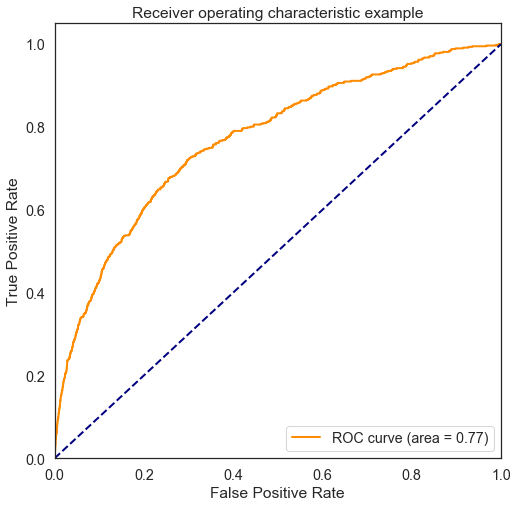

In [935]:
# first column is p of label 0, second is p of label 1
fpr, tpr, _ = roc_curve(y_test, y_hat[:,1])

fig = plt.figure()
# setting size in inches
fig.set_size_inches((8,8))
lw = 2
plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='ROC curve (area = %0.2f)' % roc_auc_lr)
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

In [936]:
# ideally run various classifiers and plot all their ROC curves on the same plot
#  with various y_hats (lr, rf, nb)
# to see which one performs the best

Getting LR Top 10 Feature Importances

In [937]:
# this is the weight for each feature
weight = clf.coef_

In [938]:
# taking the ten last elements of argsort then reversing order
top_ten_features_lr = weight.argsort()[0][-10:][::-1]

In [939]:
print(x_data.columns[top_ten_features_lr])

Index(['SPO2_MIN_DAY2', 'RESP_RATE_MEAN_DAY1', 'SYS_BP_MEAN_DAY2',
       'SPO2_MEAN_DAY2', 'HR_MIN_DAY1', 'RESP_RATE_MEAN_DAY2',
       'DIAS_BP_MAX_DAY1', 'Adltrespfl', 'MEAN_BP_MEAN_DAY2',
       'SYS_BP_MAX_DAY1'],
      dtype='object')


In [940]:
# rf doesn't have coef. will need to get feat_imp. 

In [813]:
# could try to make a better classifier (rf, nb)
# trying xgboost!!!! 
# -- will have to install from conda


In [814]:
# !conda install -c conda-forge xgboost -y

In [815]:
# after i find a good classifier, want to do good interpretation. make plots. 
# plot important features against each other, make bar graphs
# seaborn. 

# Random Forest Model

In [466]:
# Step 1 - split dataset
x_train_rf = x_train.copy()
y_train_rf = y_train.copy()

x_test_rf = x_test.copy()
y_test_rf = y_test.copy()

In [467]:
# Part 2 - greate a random forest classifier for mortality
# then re-did with the optimized params
rf_model = skens.RandomForestClassifier(n_estimators=4, max_depth=512, oob_score=True, criterion='entropy', min_samples_leaf=5, n_jobs=-1)
rf_model.fit(x_train_rf, y_train_rf)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=512, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [470]:
# Step 3 - add predicted labels to test set
# predicted_labels = rf_model.predict(df_zoo_test.ix[:,1:17])
# df_zoo_test['predicted_rf_tree'] = predicted_labels

predicted_labels_rf = rf_model.predict(x_test_rf)
y_test_rf['predicted_rf_tree'] = predicted_labels_rf

In [425]:
y_test_rf.sample(30)

,y_data,predicted_rf_tree
19688,0,0
27063,0,0
45843,0,0
8311,0,0
73333,0,0
59868,0,0
19537,0,0
21323,0,0
22235,0,0
24589,0,0


In [472]:
# Step 4 - report the accuracy 
# this accuracy means the number of correct predictions div by the total number of predictions
# this score is misleading! 
# especially when there's class imbalance (the thing i'm trying to predict is rare) then accuracy is misleading 
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test_rf["y_data"], y_test_rf.predicted_rf_tree)
print("Accuracy: {0:.2%}".format(accuracy))

Accuracy: 96.53%


In [473]:
# Step 5 - extract feature importances 
# Check feature importance
feat_importance = rf_model.feature_importances_
feat_importance_df = pd.DataFrame({'Feature Importance':feat_importance},
            index=x_train_rf.columns)

#### Feature Importance

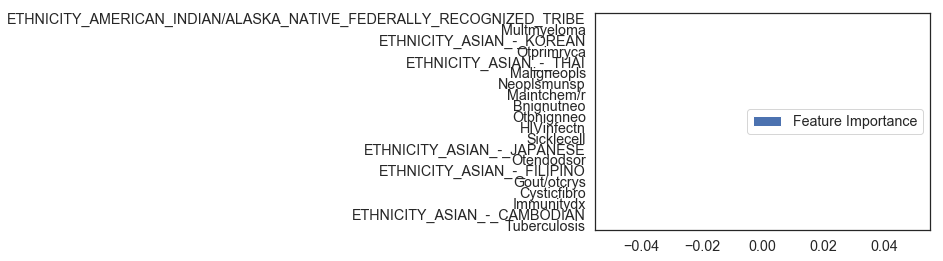

In [475]:
feat_importance_df.sort_values(by="Feature Importance", ascending=True).head(20).plot(kind="barh")

In [1077]:
# this came up with the non-disease data
# these metrics are more important than what disease they're diagnosed with
# we don't know if these diseases are assigned to them after the fact or what

In [1078]:
# difine grid params here

In [1079]:
# jordan come back to this later

In [429]:
param_grid = {'n_estimators': [256, 512, 1024, 2048],
             'max_depth': [9, 11, 13]}

In [430]:
# then went back and tried 'n_estimators': [16, 32, 64, 128], 'max_depth': [2,5,7]}. 
# because the lowest num of estimators was predicted before (500 estimators, 2 depth)

In [431]:
# want to make sure using roc_auc rather than scoring as its metric
grid_clf = GridSearchCV(rf_model, param_grid, cv=3, scoring="roc_auc", verbose=2, n_jobs=-1)
# verbose is like a progress bar
grid_clf.fit(x_train_rf,y_train_rf)

Fitting 3 folds for each of 12 candidates, totalling 36 fits
[CV] max_depth=9, n_estimators=256 ...................................
[CV] max_depth=9, n_estimators=256 ...................................
[CV] max_depth=9, n_estimators=256 ...................................
[CV] max_depth=9, n_estimators=512 ...................................
[CV] max_depth=9, n_estimators=512 ...................................
[CV] max_depth=9, n_estimators=512 ...................................
[CV] max_depth=9, n_estimators=1024 ..................................
[CV] max_depth=9, n_estimators=1024 ..................................
[CV] .................... max_depth=9, n_estimators=256, total=  50.9s
[CV] max_depth=9, n_estimators=1024 ..................................
[CV] .................... max_depth=9, n_estimators=256, total=  53.1s
[CV] max_depth=9, n_estimators=2048 ..................................
[CV] .................... max_depth=9, n_estimators=256, total=  53.5s
[CV] max_depth=9

[Parallel(n_jobs=-1)]: Done  36 out of  36 | elapsed: 12.9min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=512, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'n_estimators': [256, 512, 1024, 2048], 'max_depth': [9, 11, 13]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=2)

In [432]:
# lda to see what's co-occuring
# and could trying the multilayer perceptron in scikitlearn mlp classifier (the feed forward neural net)

In [433]:
grid_clf.best_params_


{'max_depth': 13, 'n_estimators': 2048}

In [436]:
grid_clf.best_score_

0.7387244004690795

In [435]:
# Jordan jordan

In [ ]:
# it liked max depth low of 2 and n-estim 4. which means the things it learns from the data aren't complex. 

# however, later realized thatthe grid search was looking at the accuracy not the roc_auc in determining best

#### RF ROC Curve

In [459]:
yhat_rf = rf_model.predict_proba(x_test_rf)

In [460]:
# roc(Ytest, yhat_rf[:,1])

In [461]:
yhat_rf

array([[0.96315631, 0.03684369],
       [0.99786325, 0.00213675],
       [0.95161077, 0.04838923],
       ...,
       [0.99      , 0.01      ],
       [0.96235431, 0.03764569],
       [0.93045805, 0.06954195]])

In [462]:
# pass in the true labels and then the predicted
fpr_randomforest, tpr_randomforest, _= roc_curve(y_test_rf.iloc[:,0], yhat_rf[:,1])

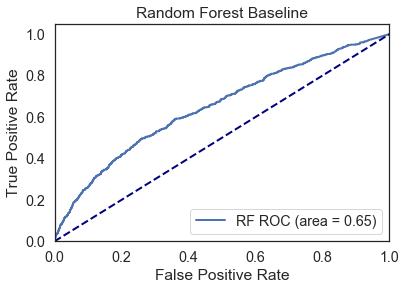

In [463]:
# roc_auc_score is a single number.
plt.figure()
plt.plot(fpr_randomforest, tpr_randomforest, lw=2, label='RF ROC (area = %0.2f)' 
         % roc_auc_score(y_test_rf.iloc[:,0], yhat_rf[:,1]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest Baseline')
plt.legend(loc="lower right")
plt.savefig("./rf_baseline.png")

In [464]:

roc_rf = roc_auc_score(y_test_rf, yhat_rf) 

ValueError: Only one class present in y_true. ROC AUC score is not defined in that case.

In [1088]:
roc_rf

0.7330469555390917

In [834]:
# original roc_auc was 68.5
#  73 with max depth 2, estim 500
# 67 with max 2, estimators 4

# RF with k-folds

In [704]:
from sklearn.model_selection import KFold # import KFold

In [705]:
# X = np.array([[1, 2], [3, 4], [1, 2], [3, 4]]) # create an array
# y = np.array([1, 2, 3, 4]) # Create another array

In [727]:
kf = KFold(n_splits=10) # Define the split - into 2 folds 

In [728]:
kf.get_n_splits(x_data_with_dummies_without_measurements) # returns the number of splitting iterations in the cross-validator

10

In [729]:
print(kf) 

KFold(n_splits=10, random_state=None, shuffle=False)


In [730]:
for train_index, test_index in kf.split(x_data.iloc[:,:]):
#     print(train_index, test_index, "\n\n")
    x_train_kfolds, x_test_kfolds = x_data_with_dummies_without_measurements.iloc[train_index], x_data_with_dummies_without_measurements.iloc[test_index]
    y_train_kfolds, y_test_kfolds = y_data.iloc[train_index], y_data.iloc[test_index]

In [731]:
rf_model_kfolds = skens.RandomForestClassifier(n_estimators=4, max_depth=512, oob_score=True, criterion='entropy', min_samples_leaf=5, n_jobs=-1)
rf_model_kfolds.fit(x_train_kfolds, y_train_kfolds)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=512, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [732]:
predicted_labels_rf_kfolds = rf_model_kfolds.predict(x_test_kfolds)
y_test_kfolds['predicted_rf_tree'] = predicted_labels_rf_kfolds

In [733]:
yhat_rf_kfolds = rf_model_kfolds.predict_proba(x_test_kfolds)

In [724]:
# y_test_kfolds

,y_data,predicted_rf_tree
40000,0,0
40001,0,0
40002,0,0
40003,0,0
40004,0,0
40005,0,0
40006,0,0
40007,0,0
40008,0,0
40009,0,0


In [648]:
for n, i in enumerate(((x_data.isin(["TSICU"]) == True).nunique() == 2)):
#     print(n, i)

0 False
1 False
2 False
3 False
4 False
5 False
6 False
7 False
8 False
9 False
10 False
11 False
12 False
13 False
14 False
15 False
16 False
17 False
18 False
19 False
20 False
21 False
22 False
23 False
24 False
25 False
26 False
27 False
28 False
29 False
30 False
31 False
32 False
33 False
34 False
35 False
36 False
37 False
38 False
39 False
40 False
41 False
42 False
43 False
44 False
45 False
46 False
47 False
48 False
49 False
50 False
51 False
52 False
53 False
54 False
55 True
56 False
57 False
58 False
59 False
60 False
61 False
62 False
63 False
64 False
65 False
66 False
67 False
68 False
69 False
70 False
71 False
72 False
73 False
74 False
75 False
76 False
77 False
78 False
79 False
80 False
81 False
82 False
83 False
84 False
85 False
86 False
87 False
88 False
89 False
90 False
91 False
92 False
93 False
94 False
95 False
96 False
97 False
98 False
99 False
100 False
101 False
102 False
103 False
104 False
105 False
106 False
107 False
108 False
109 False
110 False
1

In [649]:
for i in x_data.iloc[55,:]:
#     print(i)

Medicare
ENGL
JEWISH
MARRIED
ASIAN
F
68.0
70.963356
109.28636999999999
75.11816400000001
111.74056999999999
159.52829
134.37332
44.997585
58.058409999999995
56.597176
61.954414
89.4105
86.77048
10.090975
25.917679
17.827633
37.22545
38.532482
37.023308
97.44237
100.287254
98.846634
209.65518
281.35553
236.01161000000002
68.46602
105.17537
87.62259
101.26823399999999
163.05998
123.02774
44.640976
63.48533199999999
55.268475
61.655285
130.86682
85.7917
9.930402
34.30442
21.629599
37.500820000000004
39.198746
38.23287
92.61033
101.11769
98.779785
175.35721
294.22397
252.05061
CCU
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
1
1
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
1
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0.0
1.0
1
0
0
0
0
0
0
0
0
0
0
0
0
0


In [638]:
# for i in x_data[x_data.values]:
#     if "TSICU" isinstance

ValueError: Must pass DataFrame with boolean values only

In [ ]:
fpr_randomforest_kfolds, tpr_randomforest_kfolds, _= roc_curve(y_test_kfolds.iloc[:,0], yhat_rf_kfolds[:,1])

In [734]:
roc_rf_kfolds = roc_auc_score(y_test_kfolds.iloc[:,0], yhat_rf_kfolds[:,1]) 

In [735]:
roc_rf_kfolds

0.6784405366547004

In [736]:
param_grid = { 
    'n_estimators': [200, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : [4,5,6,7,8],
    'criterion' :['gini', 'entropy']
}

In [ ]:
# train test split is used to create a hold out set. kfolds essentially does it it in a specific way to 
# maintain class balance

In [739]:
CV_rfc = GridSearchCV(estimator=rf_model_kfolds, param_grid=param_grid, cv= 5, verbose=2)
CV_rfc.fit(x_train_kfolds, y_train_kfolds)

Fitting 5 folds for each of 60 candidates, totalling 300 fits
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=200 
[CV]  criterion=gini, max_depth=4, max_features=auto, n_estimators=200, total=  10.2s
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=200 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   10.7s remaining:    0.0s


[CV]  criterion=gini, max_depth=4, max_features=auto, n_estimators=200, total=  10.0s
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=200 
[CV]  criterion=gini, max_depth=4, max_features=auto, n_estimators=200, total=  10.9s
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=200 
[CV]  criterion=gini, max_depth=4, max_features=auto, n_estimators=200, total=  11.2s
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=200 
[CV]  criterion=gini, max_depth=4, max_features=auto, n_estimators=200, total=  10.5s
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=500 
[CV]  criterion=gini, max_depth=4, max_features=auto, n_estimators=500, total=  26.2s
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=500 
[CV]  criterion=gini, max_depth=4, max_features=auto, n_estimators=500, total=  24.6s
[CV] criterion=gini, max_depth=4, max_features=auto, n_estimators=500 
[CV]  criterion=gini, max_depth=4, max_features=auto, n_es

[Parallel(n_jobs=1)]: Done 300 out of 300 | elapsed: 94.7min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=512, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'n_estimators': [200, 500], 'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [4, 5, 6, 7, 8], 'criterion': ['gini', 'entropy']},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=2)

In [740]:
CV_rfc.best_params_


{'criterion': 'gini',
 'max_depth': 4,
 'max_features': 'auto',
 'n_estimators': 200}

In [741]:
CV_rfc.best_score_

0.965327554592432

In [746]:
rf_model_kfolds = skens.RandomForestClassifier(n_estimators=200, oob_score=True, criterion='gini', min_samples_leaf=5, n_jobs=-1, max_depth=4, max_features= 'auto')
                                              
                                            
rf_model_kfolds.fit(x_train_kfolds, y_train_kfolds)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=4, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=200, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [747]:
yhat_rf_kfolds = rf_model.predict_proba(x_test_kfolds)

In [ ]:
# predicted_labels_rf_kfolds = rf_model_kfolds.predict(x_test_kfolds)

# y_test_kfolds['predicted_rf_tree'] = predicted_labels_rf_kfolds

In [757]:
roc_rf_kfolds = roc_auc_score(y_test_kfolds.loc[:,"y_data"], yhat_rf_kfolds[:,1]) 

In [758]:
roc_rf_kfolds

0.8176031391615234

In [759]:
# probabilistic grid search. where start sampling parameters closer to the ones i found that are good. 

# Random Forest without the dummies

In [ ]:
# x_train_withoutdummies, x_test_withoutdummies, y_train_withoutdummies, y_test_withoutdummies

In [487]:
# Step 1 - split dataset
x_train_rf_wod = x_train_withoutdummies.copy()
y_train_rf_wod = y_train_withoutdummies.copy()

x_test_rf_wod = x_test_withoutdummies.copy()
y_test_rf_wod = y_test_withoutdummies.copy()

In [493]:
rf_model_wod = skens.RandomForestClassifier(n_estimators=4, max_depth=512, oob_score=True, criterion='entropy', min_samples_leaf=5, n_jobs=-1)
rf_model_wod.fit(x_train_rf_wod, y_train_rf_wod)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=512, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [494]:
predicted_labels_rf_wod = rf_model_wod.predict(x_test_rf_wod)
y_test_rf_wod['predicted_rf_tree'] = predicted_labels_rf_wod

In [496]:
# Step 4 - report the accuracy 
# this accuracy means the number of correct predictions div by the total number of predictions
# this score is misleading! 
# especially when there's class imbalance (the thing i'm trying to predict is rare) then accuracy is misleading 
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(y_test_rf_wod["y_data"], y_test_rf_wod.predicted_rf_tree)
print("Accuracy: {0:.2%}".format(accuracy))

Accuracy: 96.60%


In [498]:
# Step 5 - extract feature importances 
# Check feature importance
feat_importance = rf_model_wod.feature_importances_
feat_importance_df = pd.DataFrame({'Feature Importance':feat_importance},
            index=x_train_rf_wod.columns)

In [520]:
# param_grid = {'n_estimators': [128, 256, 512, 1024],
#              'max_depth': [7, 9, 11, 13]}

param_grid = {'n_estimators': [1024, 2048],
             'max_depth': [13, 15, 17]}

In [521]:
# want to make sure using roc_auc rather than scoring as its metric
grid_clf = GridSearchCV(rf_model_wod, param_grid, cv=3, scoring="roc_auc", verbose=2, n_jobs=-1)
# verbose is like a progress bar
grid_clf.fit(x_train_rf_wod, y_train_rf_wod)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] max_depth=13, n_estimators=1024 .................................
[CV] max_depth=13, n_estimators=1024 .................................
[CV] max_depth=13, n_estimators=1024 .................................
[CV] max_depth=13, n_estimators=2048 .................................
[CV] max_depth=13, n_estimators=2048 .................................
[CV] max_depth=13, n_estimators=2048 .................................
[CV] max_depth=15, n_estimators=1024 .................................
[CV] max_depth=15, n_estimators=1024 .................................
[CV] .................. max_depth=13, n_estimators=1024, total= 2.1min
[CV] max_depth=15, n_estimators=1024 .................................
[CV] .................. max_depth=15, n_estimators=1024, total= 2.2min
[CV] max_depth=15, n_estimators=2048 .................................
[CV] .................. max_depth=13, n_estimators=1024, total= 2.3min
[CV] max_depth=15

[Parallel(n_jobs=-1)]: Done  13 out of  18 | elapsed:  6.4min remaining:  2.5min


[CV] .................. max_depth=15, n_estimators=2048, total= 4.2min
[CV] .................. max_depth=15, n_estimators=2048, total= 4.2min
[CV] .................. max_depth=17, n_estimators=2048, total= 2.5min
[CV] .................. max_depth=17, n_estimators=2048, total= 2.6min
[CV] .................. max_depth=17, n_estimators=2048, total= 2.6min


[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:  7.2min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=512, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=4, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'n_estimators': [1024, 2048], 'max_depth': [13, 15, 17]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=2)

In [522]:
grid_clf.best_params_

{'max_depth': 17, 'n_estimators': 1024}

In [523]:
grid_clf.best_score_

0.7279933383353429

In [524]:
yhat_rf_wod = rf_model_wod.predict_proba(x_test_rf_wod)

In [527]:
# y_test_rf_wod

In [526]:
yhat_rf_wod

array([[0.98347741, 0.01652259],
       [0.98883403, 0.01116597],
       [0.95295119, 0.04704881],
       ...,
       [0.98212786, 0.01787214],
       [0.98659369, 0.01340631],
       [0.99132179, 0.00867821]])

In [528]:
roc_rf_wod = roc_auc_score(y_test_rf_wod.iloc[:,0], yhat_rf_wod[:,1]) 

In [529]:
roc_rf_wod

0.6752576669661006

### Notes

In [835]:
# DJ Says:
# conjunctive features. RF puts multiple features together. 
#  LR doesnt

# https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html
# tabular data  (like DF or SQL) to explain what's going on in the prediction model
# LDA could work to get higher level feature
# two dense layer nerual net with non-linear activation (relu) . 
# look for keras library. 
# don't have to do seq to seq stuff. feed forward neural network. 

# could try to LDA, but if it's gonna take a while do some neural stuff. 

# jared doesn't think this is a neural network problem
# could make a two-layer neural net with sklearn
# the nn does fine, but if there's an inherent structure to the data then that structure is detectable by nn, but tend to be overkill for something like this
# with image recognition every piece of data is a pixel. 

# 16, 32, 64, 128

### Naive Bayes

In [530]:
# from sklearn import datasets
from sklearn.naive_bayes import GaussianNB

In [531]:
# Step 1 - split dataset
x_train_nb = x_train.copy()
y_train_nb = y_train.copy()

x_test_nb = x_test.copy()
y_test_nb = y_test.copy()

In [532]:
gnb = GaussianNB()
gnb.fit(x_train_nb, y_train_nb)

GaussianNB(priors=None)

In [533]:
# test the model
predicted_labels_nb = gnb.predict(x_test_nb)

In [534]:
y_test_nb["predicted_labels_nb"] = predicted_labels_nb

In [535]:
y_test_nb.head()

,y_data,predicted_labels_nb
59535,0,1
55614,0,1
63628,0,1
63187,0,1
68713,0,1


In [541]:
from sklearn.metrics import accuracy_score
accuracy_nb = accuracy_score(y_test_nb.loc[:,'y_data'], y_test_nb.loc[:,'predicted_labels_nb'])
print("Accuracy: {0:.2%}".format(accuracy_nb))

Accuracy: 5.61%


In [842]:
fpr_naivebayes, tpr_naivebayes, _ = roc_curve(Ytest, yhat_nb[:,1]) 


NameError: name 'Ytest' is not defined

#### Trying NB again with Bernoulli

In [545]:
x_train_nb = x_train.copy()
y_train_nb = y_train.copy()

x_test_nb = x_test.copy()
y_test_nb = y_test.copy()

In [546]:
bnb = BernoulliNB()
bnb.fit(x_train_nb, y_train_nb)

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [547]:
# test the model
# though jared doesn't focus on the predicted labels, just the predicted p's
predicted_labels_nb = bnb.predict(x_test_nb)

In [548]:
y_test_nb["predicted_labels_nb"] = predicted_labels_nb

In [551]:
from sklearn.metrics import accuracy_score
accuracy_nb = accuracy_score(y_test_nb["y_data"], y_test_nb["predicted_labels_nb"])
print("Accuracy: {0:.2%}".format(accuracy_nb))

Accuracy: 95.96%


In [552]:
yhat_nb = bnb.predict_proba(x_test_nb)

In [557]:
roc_nb = roc_auc_score(y_test_nb.iloc[:,0], yhat_nb[:,1]) 

In [558]:
roc_nb

0.7025426255109606

In [553]:
fpr_naivebayes, tpr_naivebayes, _ = roc_curve(y_test_nb.iloc[:,0], yhat_nb[:,1]) 

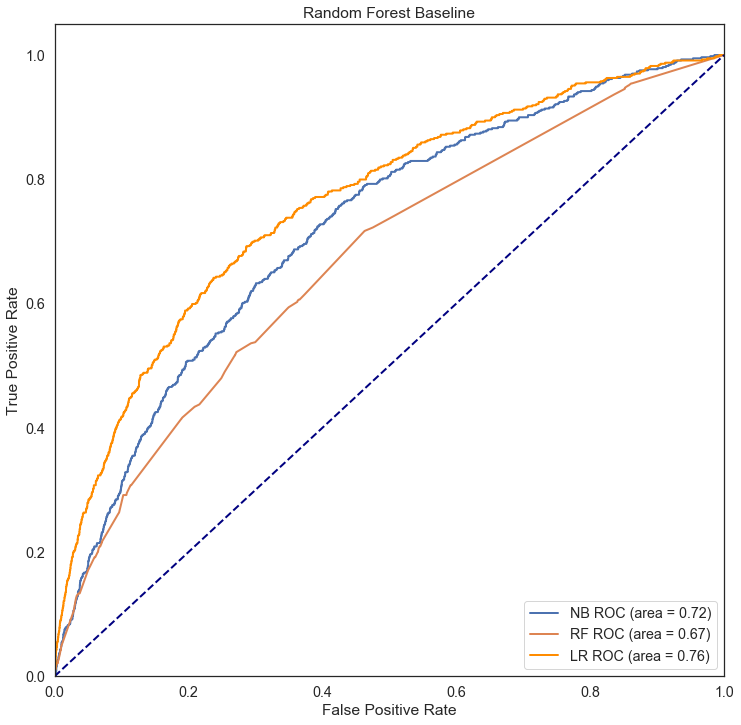

In [851]:
# roc_auc_score is a single number.
fig = plt.figure()
fig.set_size_inches(12,12)
plt.plot(fpr_naivebayes, tpr_naivebayes, lw=2, label='NB ROC (area = %0.2f)' 
         % roc_auc_score(y_test_nb.iloc[:,0], yhat_nb[:,1]))

plt.plot(fpr_randomforest, tpr_randomforest, lw=2, label='RF ROC (area = %0.2f)' 
         % roc_auc_score(y_test_rf.iloc[:,0], yhat_rf[:,1]))

plt.plot(fpr, tpr, color='darkorange',
         lw=lw, label='LR ROC (area = %0.2f)' % roc_auc_lr)

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest Baseline')
plt.legend(loc="lower right")
plt.savefig("./rf_baseline.png")

In [852]:
roc_nb = roc_auc_score(y_test_nb, yhat_nb) 

In [853]:
roc_nb

0.6406027216343427

In [854]:
roc_auc_score(y_test_nb.iloc[:,0], yhat_nb[:,1])

0.7187945567313144

In [855]:
roc_auc_score(y_test_rf.iloc[:,0], yhat_rf[:,1])

0.6696178201982884

In [856]:
# the p's as they are ascending is what determines the roc score.
# you can change the p, as long as the order is maintained 

#### Logistic Regression

In [407]:
# lr = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
lr = LogisticRegression()

In [408]:
# Step 1 - split dataset
x_train_lr = x_train.copy()
y_train_lr = y_train.copy()

x_test_lr = x_test.copy()
y_test_lr = y_test.copy()

In [409]:
lr.fit(x_train_lr, y_train_lr)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [410]:
# strongest_coef_lr = np.argsort(lr.coef_)[0][-20:] 


Grid search to optimize LR params

In [375]:
parameters = {'C':[1, 10]}
lr_grid_search = GridSearchCV(lr, parameters, cv=10, verbose=2)
lr_grid_search.fit(x_train_lr, y_train_lr)

Fitting 10 folds for each of 2 candidates, totalling 20 fits
[CV] C=1 .............................................................
[CV] .............................................. C=1, total=   1.2s
[CV] C=1 .............................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.4s remaining:    0.0s


[CV] .............................................. C=1, total=   1.1s
[CV] C=1 .............................................................
[CV] .............................................. C=1, total=   1.2s
[CV] C=1 .............................................................
[CV] .............................................. C=1, total=   1.1s
[CV] C=1 .............................................................
[CV] .............................................. C=1, total=   1.1s
[CV] C=1 .............................................................
[CV] .............................................. C=1, total=   1.1s
[CV] C=1 .............................................................
[CV] .............................................. C=1, total=   1.1s
[CV] C=1 .............................................................
[CV] .............................................. C=1, total=   1.1s
[CV] C=1 .............................................................
[CV] .

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:   28.5s finished


GridSearchCV(cv=10, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1, param_grid={'C': [1, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=2)

In [376]:
lr_grid_search.best_params_

{'C': 1}

LR was already optimized with the default params! {'C': 1, 'penalty': 'l2'}
No need to optimize. 

In [377]:
# Use score method to get accuracy of model
score_lr = lr.score(x_test_lr, y_test_lr)
print("Score:", score_lr)

Score: 0.9651831478934867


In [415]:
# clf = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial').fit(x_train, y_train)
y_hat_lr = lr.predict_proba(x_test_lr) 

In [419]:
roc_lr = roc_auc_score(y_test_lr, y_hat_lr[:,1])  

In [420]:
roc_lr

0.7362177563174779

Logisitic Regression Produced a ROC AUC Score of 82.72%.

In [133]:
lr_feat_importance_df = pd.DataFrame({'Feature Importance':lr.coef_[0]},
            index=x_train_lr.columns)

In [134]:
lr_feat_importance_df.sort_values(by= "Feature Importance", ascending=False)

,Feature Importance
Cardiaarrst,1.845680
Peripathero,1.023637
ETHNICITY_ASIAN_-_THAI,0.881905
Intobstruct,0.860840
Otupprresp,0.815544
LANGUAGE_**SH,0.808303
Osteoporosis,0.718452
Coag/hemrdx,0.702488
AcuteCVD,0.674409
Otdxkidney,0.630931


### Making full ROC-AUC graph

In [ ]:
##fpr and tpr are like x and y values
## this figure shows up in every machine learning classifier paper
# this curve moves up if you identify true pos. (correctly), 
# moves to the right if you identify something wrong
# worst score = .5 (baseline, 50/50), best score is 1

##document-term matrix is not capturing all features of irony well

from sklearn.metrics import roc_curve

fpr_randomforest, tpr_randomforest, _ = roc_curve(Ytest, yhat_rf[:,1]) 
fpr_naivebayes, tpr_naivebayes, _ = roc_curve(Ytest, yhat_nb[:,1]) 
fpr_logisticregression, tpr_logisticregression, _ = roc_curve(Ytest, yhat_lr[:,1]) 

plt.figure()
plt.plot(fpr_randomforest, tpr_randomforest, lw=2,
         label='RF ROC curve (area = %0.2f)' % roc(Ytest, yhat_rf[:,1]))
plt.plot(fpr_naivebayes, tpr_naivebayes, lw=2,
         label='NB ROC curve (area = %0.2f)' % roc(Ytest, yhat_nb[:,1]))
plt.plot(fpr_logisticregression, tpr_logisticregression, lw=2,
         label='LR ROC curve (area = %0.2f)' % roc(Ytest, yhat_lr[:,1]))
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.savefig("./empath_array_roc_curve_baseline.png")

### Investigating Clustering

Investigating how many symptoms people present with to figure out if I should do clustering. Looking at columns 60: where binary data starts. 

In [110]:
# cluster_df = read_csv2.copy()

cluster_df = x_data.copy()

In [111]:
cluster_df.head()

,Tuberculosis,Immuniz/scrn,AcuteMI,Coronathero,Chestpain,Pulmhartdx,Othheartdx,Conduction,Dysrhythmia,Cardiaarrst,...,Eyeinfectn,Othereyedx,Otitismedia,Dizziness,Othereardx,Othnervdx,Hrtvalvedx,Carditis,HTN,Htncomplicn
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0.0,0,0,0,0.0
1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0.0,0.0,0,0,0,1.0
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0.0,0.0,0,0,0,0.0
3,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0.0,0.0,0,0,1,0.0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0.0,0,0,0,0.0


In [167]:
import numpy as np
cluster_df["sum_binary"] = np.sum(cluster_df.iloc[60:,:],axis=1)
# cluster_df["sum_binary"] = df.sum(axis=0)


In [179]:
col_list = cluster_df.columns[60:-1]

In [279]:
col_list

Index(['Tuberculosis', 'Immuniz/scrn', 'AcuteMI', 'Coronathero', 'Chestpain',
       'Pulmhartdx', 'Othheartdx', 'Conduction', 'Dysrhythmia', 'Cardiaarrst',
       ...
       'Eyeinfectn', 'Othereyedx', 'Otitismedia', 'Dizziness', 'Othereardx',
       'Othnervdx', 'Hrtvalvedx', 'Carditis', 'HTN', 'Htncomplicn'],
      dtype='object', length=281)

In [188]:
cluster_df['sum_binary_variables'] = cluster_df[col_list].sum(axis=1)

In [194]:
cluster_df.sum_binary_variables.value_counts()

4.0     10942
3.0     10334
5.0      9839
6.0      8444
2.0      8108
7.0      6516
8.0      4992
1.0      4986
9.0      3645
10.0     2761
0.0      2095
11.0     2059
12.0     1505
13.0     1055
14.0      770
15.0      557
16.0      411
17.0      311
18.0      213
19.0      140
20.0       97
21.0       73
22.0       49
23.0       34
25.0       18
24.0       13
26.0        9
28.0        7
30.0        5
27.0        3
29.0        3
31.0        2
32.0        1
Name: sum_binary_variables, dtype: int64

Most people have less than 10 binary symptoms. Majority have 2-6 binary symtoms.  Most people have less than 13. No one has 32.

Re-doing Logistic Regression with number of individual issues as the predictor.
First, going back to x_data and isolating the columns that just have disease binaries. Then running the LR and RF again to see if it makes a difference. 

In [ ]:
# lr = LogisticRegression(C=1,penalty="l2")
# lr.fit(x_train_lr, y_train_lr)

In [421]:
x_data_WITHOUT_dummies_without_measurements.head()

,Tuberculosis,Immuniz/scrn,AcuteMI,Coronathero,Chestpain,Pulmhartdx,Othheartdx,Conduction,Dysrhythmia,Cardiaarrst,...,Eyeinfectn,Othereyedx,Otitismedia,Dizziness,Othereardx,Othnervdx,Hrtvalvedx,Carditis,HTN,Htncomplicn
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0.0,0,0,0,0.0
1,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0.0,0.0,0,0,0,1.0
2,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0.0,0.0,0,0,0,0.0
3,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0.0,0.0,0,0,1,0.0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0.0,0.0,0,0,0,0.0


#### Was going to start over with the clean up process
##### but this is really just the same as x_data_WITHOUT_dummies_without_measurements

Starting over with the data cleanup process to get rid of the social predictors and just isolate the diseases.

In [254]:
with open("public_data_1/mimic_synthetic_feat.name") as f:
    header_data = f.readlines()
    header_data = [line.strip("\n") for line in header_data]
read_csv3 = pd.read_csv('public_data_1/mimic_synthetic_train.data', header=None, names =header_data, delim_whitespace=True, 
                      skip_blank_lines=True,  error_bad_lines=False)

In [255]:
with open('public_data_1/mimic_synthetic_feat.type') as f:
    cat_bin_index = f.readlines()
    cat_bin_index = [line.strip("\n") for line in cat_bin_index]

In [257]:
cat_gender_lst = []
for i, cat in enumerate(cat_bin_index):
    if cat == "Categorical":
        cat_gender_lst.append(i)    

In [258]:
dummy_columns_lst = []
for i in cat_gender_lst[2:]:
    dummy_columns_lst.append(read_csv3.columns[i])
    

In [259]:
dummy_columns_lst

['INSURANCE', 'LANGUAGE', 'RELIGION', 'MARITAL_STATUS', 'ETHNICITY', 'ICU']

In [260]:
# for i, t in enumerate(read_csv3.GENDER):
#     if t == "82":
#     if t == "81"    
#         print((i,t))
read_csv3.drop([32539,53191], inplace=True)

In [ ]:
# creating rows with 281 characteristics summed

In [318]:
sum_variables = pd.DataFrame(read_csv3[read_csv3.columns[60:]].sum(axis=1))

In [319]:
type(sum_variables)

pandas.core.frame.DataFrame

#### now i can look at the binary sums and do the classifiers just with that and the y data. 

In [ ]:
# x_data2 = read_csv3[read_csv3.columns[4:]]

In [ ]:
# binary_qualities_columns = x_data2.columns[49:-149]

In [ ]:
# x_data2.fillna(-1, inplace=True)

In [ ]:
# x_data2 = pd.get_dummies(x_data2, columns=dummy_columns_lst)
# x_data2.dtypes
# for i, t in enumerate(x_data.dtypes):
#     if t == "object":
#         print((i,t))

In [327]:
x_train_sum_variables, x_test_sum_variables, y_train_sum_variables, y_test_sum_variables = train_test_split(sum_variables, y_data2, test_size=0.2)

In [328]:
lr = LogisticRegression()
lr.fit(x_train_sum_variables, y_train_sum_variables)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [329]:
parameters = {'penalty':('l1', 'l2'), 'C':[1, 10]}
clf = GridSearchCV(lr, parameters, cv=5, verbose=2)
clf.fit(x_train_sum_variables, y_train_sum_variables)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] C=1, penalty=l1 .................................................
[CV] .................................. C=1, penalty=l1, total=   0.1s
[CV] C=1, penalty=l1 .................................................
[CV] .................................. C=1, penalty=l1, total=   0.1s
[CV] C=1, penalty=l1 .................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s


[CV] .................................. C=1, penalty=l1, total=   0.1s
[CV] C=1, penalty=l1 .................................................
[CV] .................................. C=1, penalty=l1, total=   0.1s
[CV] C=1, penalty=l1 .................................................
[CV] .................................. C=1, penalty=l1, total=   0.1s
[CV] C=1, penalty=l2 .................................................
[CV] .................................. C=1, penalty=l2, total=   0.1s
[CV] C=1, penalty=l2 .................................................
[CV] .................................. C=1, penalty=l2, total=   0.1s
[CV] C=1, penalty=l2 .................................................
[CV] .................................. C=1, penalty=l2, total=   0.1s
[CV] C=1, penalty=l2 .................................................
[CV] .................................. C=1, penalty=l2, total=   0.0s
[CV] C=1, penalty=l2 .................................................
[CV] .

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    1.3s finished


GridSearchCV(cv=5, error_score='raise',
       estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'penalty': ('l1', 'l2'), 'C': [1, 10]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring=None, verbose=2)

In [330]:
clf.best_params_

{'C': 1, 'penalty': 'l1'}

In [349]:
lr = LogisticRegression(C=1,penalty="l2")
lr.fit(x_train_sum_variables, y_train_sum_variables)

LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='ovr', n_jobs=1,
          penalty='l2', random_state=None, solver='liblinear', tol=0.0001,
          verbose=0, warm_start=False)

In [335]:
yhat_sum_variables =lr.predict_proba(x_test_sum_variables)

In [337]:
yhat_sum_variables[:,1]

array([0.03988707, 0.03224574, 0.03224574, ..., 0.0312767 , 0.03033587,
       0.02942248])

In [345]:
roc_sum_variables

0.5483833155995559

In [350]:
yhat_sum_variables = lr.predict(x_test_sum_variables)

In [351]:
score = lr.score(x_test_sum_variables, y_test_sum_variables)
print("score", score)

score 0.965


In [357]:
roc_sum_variables = roc_auc_score(y_test_sum_variables, yhat_sum_variables) 

In [359]:
roc_sum_variables

0.5

In [ ]:
# lda to cluster diseases to find co-occuring topics

# Multilayer perceptron (i.e. feedforward nn)

In [438]:
# can mess with hidden layer size and num layers, otherwise default params
# hidden layer size = 100x100

# want to do it on whole thing, not just disease data

In [563]:
mlp = MLPClassifier(hidden_layer_sizes=(100, 200, 300))
# since there isn't a structure we're exploring, it's more of seeing what sticks

In [564]:
# Step 1 - split dataset
x_train_mlp = x_train.copy()
y_train_mlp= y_train.copy()

x_test_mlp = x_test.copy()
y_test_mlp = y_test.copy()

In [565]:
mlp.fit(x_train_mlp, y_train_mlp)

MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100, 200, 300), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False)

In [566]:
yhat_mlp = mlp.predict_proba(x_test_mlp)

In [567]:
yhat_mlp

array([[1.00000000e+00, 9.81670876e-14],
       [9.99997231e-01, 2.76889099e-06],
       [9.99986749e-01, 1.32509113e-05],
       ...,
       [1.00000000e+00, 2.38499877e-12],
       [1.00000000e+00, 2.08542635e-11],
       [9.99999369e-01, 6.30986388e-07]])

In [568]:
# pass in the true labels and then the predicted
# fpr_mlp, tpr_mlp, _= roc_curve(y_test_mlp.iloc[:,0], yhat_mlp[:,1])
fpr_mlp, tpr_mlp, _= roc_curve(y_test_mlp.iloc[:,0], yhat_mlp[:,1])

In [569]:
roc_mlp = roc_auc_score(y_test_mlp.iloc[:,0], yhat_mlp[:,1]) 

In [570]:
roc_mlp

0.5942581058037899

In [493]:
# expect RF to do as well when optimized
# roc got around 80
# if we wanted to do more sophisticated neural nets, could go higher
# we we increase the number of neurons, need to add drop out to avoid overfitting
# however, can't do drop out in sklearn


In [450]:
# number of neurons in the hidden layers of the neural networks
# (100, 200, 300, 400) this is a neural network with four layers
# there's no way to decide how many layers to put in there other than experimenting
# jared says will overfit if increase too much. don't do too many layers
# parameters = {'hidden_layer_sizes': [(100, 200, 300), (25, 50, 100), (25, 100), (50, 100), (25, 50)]}
# parameters = {'hidden_layer_sizes': [(50,50), (25, 25), (75, 75), (50,50,50), (25,25,25)]}
# parameters = {'hidden_layer_sizes': [(15,15), (25, 25), (10,10), (15, 15, 15), (25, 50), (15, 15, 15, 15)]}
parameters = {'hidden_layer_sizes': [(15,15), (25, 25), (10,10), (15, 15, 15), (25, 50), (15, 15, 15, 15)]}


clf = GridSearchCV(mlp, parameters, cv=3, verbose=2, n_jobs=-1, scoring="roc_auc")
clf.fit(x_train_mlp, y_train_mlp)

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] hidden_layer_sizes=(15, 15) .....................................
[CV] hidden_layer_sizes=(15, 15) .....................................
[CV] hidden_layer_sizes=(15, 15) .....................................
[CV] hidden_layer_sizes=(25, 25) .....................................
[CV] hidden_layer_sizes=(25, 25) .....................................
[CV] hidden_layer_sizes=(25, 25) .....................................
[CV] hidden_layer_sizes=(10, 10) .....................................
[CV] hidden_layer_sizes=(10, 10) .....................................
[CV] ...................... hidden_layer_sizes=(10, 10), total= 1.0min
[CV] hidden_layer_sizes=(10, 10) .....................................
[CV] ...................... hidden_layer_sizes=(10, 10), total= 1.1min
[CV] hidden_layer_sizes=(15, 15, 15) .................................
[CV] ...................... hidden_layer_sizes=(15, 15), total= 1.4min
[CV] hidden_layer

[Parallel(n_jobs=-1)]: Done  13 out of  18 | elapsed:  4.4min remaining:  1.7min


[CV] .............. hidden_layer_sizes=(15, 15, 15, 15), total= 1.8min
[CV] ...................... hidden_layer_sizes=(25, 50), total= 2.1min
[CV] .............. hidden_layer_sizes=(15, 15, 15, 15), total= 1.6min
[CV] ...................... hidden_layer_sizes=(25, 50), total= 2.9min
[CV] ...................... hidden_layer_sizes=(25, 50), total= 2.5min


[Parallel(n_jobs=-1)]: Done  18 out of  18 | elapsed:  5.1min finished


GridSearchCV(cv=3, error_score='raise',
       estimator=MLPClassifier(activation='relu', alpha=0.0001, batch_size='auto', beta_1=0.9,
       beta_2=0.999, early_stopping=False, epsilon=1e-08,
       hidden_layer_sizes=(100, 200, 300), learning_rate='constant',
       learning_rate_init=0.001, max_iter=200, momentum=0.9,
       nesterovs_momentum=True, power_t=0.5, random_state=None,
       shuffle=True, solver='adam', tol=0.0001, validation_fraction=0.1,
       verbose=False, warm_start=False),
       fit_params=None, iid=True, n_jobs=-1,
       param_grid={'hidden_layer_sizes': [(15, 15), (25, 25), (10, 10), (15, 15, 15), (25, 50), (15, 15, 15, 15)]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=2)

In [451]:
clf.best_params_

{'hidden_layer_sizes': (10, 10)}

In [452]:
clf.best_score_

0.6783017623098064

In [ ]:
# best = 80.6 wtih (50,100)
# best with 50,50 = 80.8
# best with 25, 25, = 81

#best is 15, 15, with 80.99

In [453]:
yhat_mlp = rf_model.predict_proba(x_test_rf)

In [454]:
yhat_mlp

array([[0.96315631, 0.03684369],
       [0.99786325, 0.00213675],
       [0.95161077, 0.04838923],
       ...,
       [0.99      , 0.01      ],
       [0.96235431, 0.03764569],
       [0.93045805, 0.06954195]])

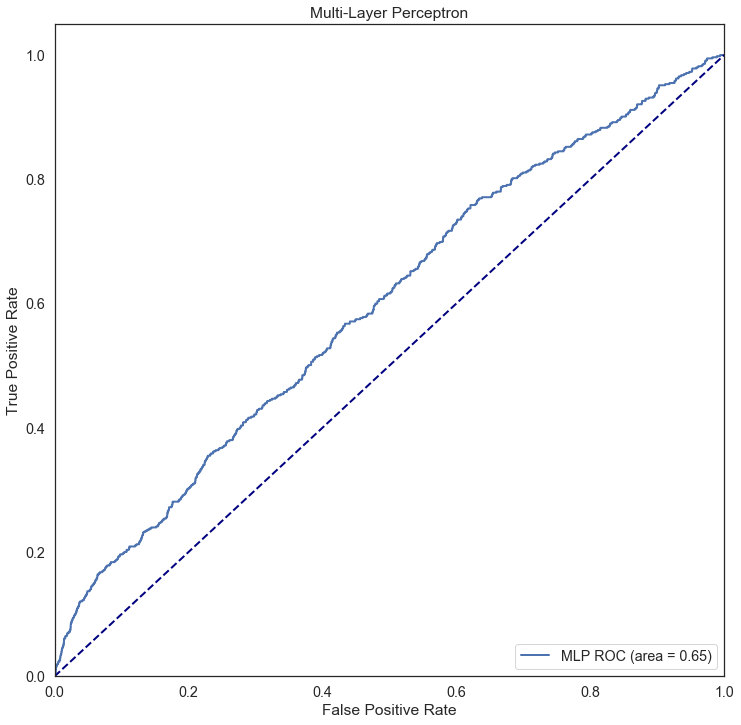

In [455]:
# oc_auc_score is a single number.
fig = plt.figure()
fig.set_size_inches(12,12)
plt.plot(fpr_mlp, tpr_mlp, lw=2, label='MLP ROC (area = %0.2f)' 
         % roc_auc_score(y_test_mlp.iloc[:,0], yhat_mlp[:,1]))

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-Layer Perceptron')
plt.legend(loc="lower right")
plt.savefig("./mlp.png")

# LDA on disease clusters to find co-occuring diseases

In [533]:
!pip install lda

    100% |████████████████████████████████| 409kB 5.1MB/s 
    100% |████████████████████████████████| 102kB 8.3MB/s 


In [606]:
# this is my vocabulary.
colum_names = x_data.columns[49:330]
X = x_data[colum_names].astype(int).replace(-1, 0)

In [607]:
X.values

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 1],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [608]:
# x is the matrix
# X = lda.datasets.load_reuters()
vocab = colum_names.copy()
# titles = lda.datasets.load_reuters_titles()
X.shape
X.sum()

Tuberculosis                                 0
Immuniz/scrn                                 1
AcuteMI                                   6174
Coronathero                              23607
Chestpain                                    0
Pulmhartdx                                 492
Othheartdx                                   0
Conduction                                 716
Dysrhythmia                              23976
Cardiaarrst                                 49
chf;nonhp                                17691
AcuteCVD                                  4448
Hd/nckcancr                                  0
Precereoccl                                  1
OtherCVD                                     0
TIA                                          0
LateeffCVD                                   3
Peripathero                                430
Aneurysm                                   158
Artembolism                                  0
Otcirculdx                                1813
Phlebitis    

In [609]:
# need to remove columns with count of 0 
X = X.loc[(X.sum(axis=1) != 0), (X.sum(axis=0) != 0)]

In [610]:
from scipy.sparse import csc_matrix

In [611]:
sum(X.sum(axis=1) == 0)

0

In [598]:
ii, jj = np.nonzero(X.values)

In [601]:
ss = X.values[ii, jj]

In [605]:
ss[ss != 1]

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1])

In [602]:
DS = np.repeat(ii, ss).astype(np.intc)

array([1, 1, 1, ..., 1, 1, 1])

In [615]:
model = lda.LDA(n_topics=20, n_iter=1500, random_state=1)
model.fit(csc_matrix(X.values))  # model.fit_transform(X) is also available

INFO:lda:n_documents: 77902
INFO:lda:vocab_size: 118
INFO:lda:n_words: 440647
INFO:lda:n_topics: 20
INFO:lda:n_iter: 1500
INFO:lda:<0> log likelihood: -3317485
INFO:lda:<10> log likelihood: -2603150
INFO:lda:<20> log likelihood: -2506559
INFO:lda:<30> log likelihood: -2438069
INFO:lda:<40> log likelihood: -2403114
INFO:lda:<50> log likelihood: -2378017
INFO:lda:<60> log likelihood: -2363137
INFO:lda:<70> log likelihood: -2354112
INFO:lda:<80> log likelihood: -2349381
INFO:lda:<90> log likelihood: -2345679
INFO:lda:<100> log likelihood: -2342030
INFO:lda:<110> log likelihood: -2336616
INFO:lda:<120> log likelihood: -2333462
INFO:lda:<130> log likelihood: -2328958
INFO:lda:<140> log likelihood: -2327053
INFO:lda:<150> log likelihood: -2325587
INFO:lda:<160> log likelihood: -2323121
INFO:lda:<170> log likelihood: -2324664
INFO:lda:<180> log likelihood: -2324135
INFO:lda:<190> log likelihood: -2323395
INFO:lda:<200> log likelihood: -2321832
INFO:lda:<210> log likelihood: -2321432
INFO:lda:

In [616]:
# these are the distributions. the p of each disease in each topic
# each topic has a p for each disease.
# could chose the topic with the highest p of death
topic_word = model.topic_word_  # model.components_ also works 

In [617]:
# the 8 most likely dieaseses for each topic after it trains the model
n_top_words = 8
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-(n_top_words+1):-1]
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))
    
#     non neg matrix factorization. class in sklearn. swap out lda for nmf. might do better with really common words. or just remove words
# that are frequent in all documents. 
# countvectorizer in sklearn that will preprocess the text into the right format and remove words that occur in 95% of the documens

Topic 0: Pulmhartdx Backproblem Acrenlfail Osteoarthros AcuteMI Inducabortn Othmalegen Conduction
Topic 1: Osteoporosis Intestinfct AcuteMI Conduction Inducabortn Otupprresp GI/peritcan Otcirculdx
Topic 2: GI/peritcan OtherGUdx UTI Backproblem Hemorrpreg Otpregcomp Otupprresp Hemmorhoids
Topic 3: Appendicitis UTI Otcirculdx GI/peritcan Otupprresp TIA Hemorrpreg Teethdx
Topic 4: Backproblem AcuteMI Inducabortn Pulmhartdx Osteoarthros Feminfertil Conduction Acrenlfail
Topic 5: Pulmhartdx AcuteMI Conduction Backproblem Osteoarthros Acrenlfail GI/peritcan Inducabortn
Topic 6: Backproblem Rheumarth Dysrhythmia Inducabortn Teethdx Pulmhartdx OtherGUdx AcuteMI
Topic 7: Intestinfct Osteoporosis Otupprresp GI/peritcan Otfemalgen Appendicitis Hemorrpreg Conduction
Topic 8: Backproblem AcuteMI Inducabortn Acrenlfail Pulmhartdx Osteoarthros Feminfertil Immuniz/scrn
Topic 9: Stomchcancr Otcomplbir Earlylabor Otupprresp GI/peritcan Backproblem Hemorrpreg Adltrespfl
Topic 10: Appendicitis Othmalegen 

In [619]:
# look at which diseases are most prominenat
# for each disease, what proportion of the row has that disease.
# can look at converting the doc-term matrix (X matrix)
# could convert the term frequesncy by document frequency matrix


# tf-idf vectorizer eats the data onces its been turned into a matrix
# tfidf transformer you call fit_transform on something that's already a matrix
from sklearn.feature_extraction.text import TfidfTransformer

In [620]:
tf_idf = TfidfTransformer()

In [621]:
X_tf_idf = tf_idf.fit_transform(X)

In [623]:
# lda want count values, not tf_idf. 
model = lda.LDA(n_topics=20, n_iter=1500, random_state=1)
model.fit(X_tf_idf) # model.fit_transform(X) is also available

INFO:lda:n_documents: 77902
INFO:lda:vocab_size: 118
INFO:lda:n_words: 171902
INFO:lda:n_topics: 20
INFO:lda:n_iter: 1500


ValueError: expected sparse matrix with integer values, found float values

Wasn't able to do LDA on TF-IDF matrix, so trying it again with the sklearn. 

In [652]:
from sklearn.decomposition import LatentDirichletAllocation

# from sklearn.datasets import make_multilabel_classification

#  # This produces a feature matrix of token counts, similar to what
#  # CountVectorizer would produce on text.

# X, _ = make_multilabel_classification(random_state=0)
lda2 = LatentDirichletAllocation(n_components=5, random_state=0)

In [653]:
lda2.fit(X) 

# LatentDirichletAllocation(...)

#  # get topics for some given samples:
# lda.transform(X[-2:])
# # array([[0.00360392, 0.25499205, 0.0036211 , 0.64236448, 0.09541846],
# #        [0.15297572, 0.00362644, 0.44412786, 0.39568399, 0.003586  ]])

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
             evaluate_every=-1, learning_decay=0.7, learning_method=None,
             learning_offset=10.0, max_doc_update_iter=100, max_iter=10,
             mean_change_tol=0.001, n_components=5, n_jobs=1,
             n_topics=None, perp_tol=0.1, random_state=0,
             topic_word_prior=None, total_samples=1000000.0, verbose=0)

In [654]:
# model.doc_topic_
# lda.tf_feature_names = lda.get_feature_names()
# lda.get_feature_names(X)
# tf_idf.get_feature_names(X)

In [669]:
lda2.components_

(5, 118)

In [ ]:
# lda.transform(X[-2:])


In [ ]:
# trying again with sklearn lda because scikit could not support a tfidf vector

# finding the disease stopwords and removing them. tf-idf should account for them a bit

# once LDA is good can try training a logistic regression on the doc-topic matrix (the topic dist for each person)


In [ ]:
# jared says:
# after this model is trained, i have a topic distribution for each person.
# can take that matrix 
# will look at the feature importance on the logistic regression. 
# a number of people by 20 (topics) matrix. can trian a logistic regression on the die dididn't die
# see what topics are the best predictors of death

In [ ]:
# once i get the nmf out, 

# take the lda/nmf output and put extra columns on the end of it. in pandas can concat the extra rows and columns. 
# should do that before i split into test/train. for instance i, it would be the 20 nmf scores for instance i. 
# in order ot then do logistic regression onit
# 

## NMF

In [1058]:
nmf_model = NMF(n_components=2, init='random', random_state=0)

In [1063]:
x_train_rf2 = x_train_rf2.replace(-1, 0)

In [1065]:
W = nmf_model.fit_transform(x_train_rf2)

In [1068]:
H = nmf_model.components_

# LIME

In [ ]:
# https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html

In [672]:
!pip install lime

    100% |████████████████████████████████| 276kB 5.1MB/s 
  Running setup.py bdist_wheel for lime ... done
  Stored in directory: /Users/Jordan_Earnest/Library/Caches/pip/wheels/48/13/7c/20792e4efe5fd04237c0ac92bc8551acfe36392e09953ac8ea
Successfully built lime


In [870]:
x_data.columns.tolist()

['INSURANCE',
 'LANGUAGE',
 'RELIGION',
 'MARITAL_STATUS',
 'ETHNICITY',
 'GENDER',
 'AGE',
 'HR_MIN_DAY1',
 'HR_MAX_DAY1',
 'HR_MEAN_DAY1',
 'SYS_BP_MIN_DAY1',
 'SYS_BP_MAX_DAY1',
 'SYS_BP_MEAN_DAY1',
 'DIAS_BP_MIN_DAY1',
 'DIAS_BP_MAX_DAY1',
 'DIAS_BP_MEAN_DAY1',
 'MEAN_BP_MIN_DAY1',
 'MEAN_BP_MAX_DAY1',
 'MEAN_BP_MEAN_DAY1',
 'RESP_RATE_MIN_DAY1',
 'RESP_RATE_MAX_DAY1',
 'RESP_RATE_MEAN_DAY1',
 'TEMP_MIN_DAY1',
 'TEMP_MAX_DAY1',
 'TEMP_MEAN_DAY1',
 'SPO2_MIN_DAY1',
 'SPO2_MAX_DAY1',
 'SPO2_MEAN_DAY1',
 'GLUCOSE_MIN_DAY1',
 'GLUCOSE_MAX_DAY1',
 'GLUCOSE_MEAN_DAY1',
 'HR_MIN_DAY2',
 'HR_MAX_DAY2',
 'HR_MEAN_DAY2',
 'SYS_BP_MIN_DAY2',
 'SYS_BP_MAX_DAY2',
 'SYS_BP_MEAN_DAY2',
 'DIAS_BP_MIN_DAY2',
 'DIAS_BP_MAX_DAY2',
 'DIAS_BP_MEAN_DAY2',
 'MEAN_BP_MIN_DAY2',
 'MEAN_BP_MAX_DAY2',
 'MEAN_BP_MEAN_DAY2',
 'RESP_RATE_MIN_DAY2',
 'RESP_RATE_MAX_DAY2',
 'RESP_RATE_MEAN_DAY2',
 'TEMP_MIN_DAY2',
 'TEMP_MAX_DAY2',
 'TEMP_MEAN_DAY2',
 'SPO2_MIN_DAY2',
 'SPO2_MAX_DAY2',
 'SPO2_MEAN_DAY2',
 'GLUCOS

In [871]:
feature_names= x_data.columns.tolist()

In [874]:
categorical_features = [0, 1, 2, 3, 4, 5, 55]

In [875]:
from sklearn.preprocessing import LabelEncoder
import lime
import lime.lime_tabular
from __future__ import print_function

In [901]:
# assign a number to every category in those columns. 
categorical_names = {}
for feature in categorical_features:
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(x_data.iloc[:, feature])
    x_data.iloc[:, feature] = le.transform(x_data.iloc[:, feature])
    categorical_names[feature] = le.classes_

In [902]:
data = x_data.copy().astype(float)

In [903]:
encoder = sklearn.preprocessing.OneHotEncoder(categorical_features=categorical_features)

In [904]:
np.random.seed(1)
train, test, labels_train, labels_test = train_test_split(data, labels, train_size=0.80)

In [905]:
encoder.fit(data)
encoded_train = encoder.transform(train)

In [906]:
import xgboost
%matplotlib inline

In [909]:
rftree = skens.RandomForestClassifier()
# rf_tree = xgboost.XGBClassifier(n_estimators=300, max_depth=5)

rftree.fit(encoded_train, labels_train)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [910]:
sklearn.metrics.accuracy_score(labels_test, rftree.predict(encoder.transform(test)))

0.9661832729091137

In [911]:
roc_auc_score(labels_test, rftree.predict(encoder.transform(test)))

0.4999353127627919

In [914]:
# CV_rfc = GridSearchCV(estimator=rf_model_kfolds, param_grid=param_grid, cv= 5, verbose=2)
grid_clf = GridSearchCV(rftree, param_grid, cv=5, scoring="roc_auc", verbose=2, n_jobs=-1)


In [916]:
grid_clf.best_params_

AttributeError: 'GridSearchCV' object has no attribute 'best_params_'

# random grid

In [912]:
from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [913]:
random_grid

{'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000],
 'max_features': ['auto', 'sqrt'],
 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None],
 'min_samples_split': [2, 5, 10],
 'min_samples_leaf': [1, 2, 4],
 'bootstrap': [True, False]}

In [919]:
# Random search of parameters, using 3 fold cross validation, 
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rftree, 
                               param_distributions = random_grid, 
                               n_iter = 100, cv = 3, verbose=2, 
                               random_state=42, n_jobs = -1,
                              scoring = 'roc_auc')
# Fit the random search model
rf_random.fit(train, labels_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV] n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True 
[CV] n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True 
[CV] n_estimators=400, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=30, bootstrap=True 
[CV] n_estimators=2000, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=True 
[CV] n_estimators=2000, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=True 
[CV] n_estimators=2000, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=True 
[CV] n_estimators=1200, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=10, bootstrap=False 
[CV] n_estimators=1200, min_samples_split=5, min_samples_leaf=2, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=400, mi

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed: 28.8min


[CV]  n_estimators=400, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=70, bootstrap=True, total= 2.2min
[CV] n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, bootstrap=False 
[CV]  n_estimators=400, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=70, bootstrap=True, total= 2.1min
[CV] n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, bootstrap=False 
[CV]  n_estimators=1000, min_samples_split=2, min_samples_leaf=1, max_features=auto, max_depth=50, bootstrap=False, total= 9.1min
[CV] n_estimators=800, min_samples_split=5, min_samples_leaf=1, max_features=sqrt, max_depth=90, bootstrap=False 
[CV]  n_estimators=1800, min_samples_split=5, min_samples_leaf=4, max_features=auto, max_depth=10, bootstrap=False, total= 8.8min
[CV] n_estimators=2000, min_samples_split=10, min_samples_leaf=1, max_features=sqrt, max_depth=10, bootstrap=False 
[CV]  n_estimators=1000,

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed: 149.5min


[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=4, max_features=sqrt, max_depth=70, bootstrap=False, total=10.3min
[CV] n_estimators=2000, min_samples_split=10, min_samples_leaf=2, max_features=auto, max_depth=50, bootstrap=False 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=4, max_features=sqrt, max_depth=70, bootstrap=False, total=10.5min
[CV] n_estimators=2000, min_samples_split=10, min_samples_leaf=2, max_features=auto, max_depth=50, bootstrap=False 
[CV]  n_estimators=1200, min_samples_split=2, min_samples_leaf=4, max_features=sqrt, max_depth=70, bootstrap=False, total=10.5min
[CV] n_estimators=1000, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, bootstrap=False 
[CV]  n_estimators=600, min_samples_split=2, min_samples_leaf=2, max_features=sqrt, max_depth=110, bootstrap=False, total= 5.5min
[CV] n_estimators=1000, min_samples_split=10, min_samples_leaf=4, max_features=auto, max_depth=50, bootstrap=False 
[CV]  n_estimato

[Parallel(n_jobs=-1)]: Done 300 out of 300 | elapsed: 317.0min finished


RandomizedSearchCV(cv=3, error_score='raise',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
          fit_params=None, iid=True, n_iter=100, n_jobs=-1,
          param_distributions={'n_estimators': [200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000], 'max_features': ['auto', 'sqrt'], 'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, None], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]},
          pre_dispatch='2*n_jobs', random_state=42, refit=True,
          return_train_score='warn', scoring='roc_auc', verbose=2)

In [920]:
rf_random.best_params_

{'n_estimators': 2000,
 'min_samples_split': 2,
 'min_samples_leaf': 4,
 'max_features': 'auto',
 'max_depth': 30,
 'bootstrap': False}

In [921]:
rf_random.best_score_

0.7834033366120535

### Explainer

In [884]:
predict_fn = lambda x: rftree.predict_proba(encoder.transform(x)).astype(float)


In [885]:
explainer = lime.lime_tabular.LimeTabularExplainer(train.values,
                                                   feature_names = feature_names, 
                                                   class_names=["survived", "died"],
                                                   categorical_features=categorical_features, 
                                                   categorical_names= categorical_names, 
                                                   kernel_width=3)

In [886]:
# i is a single row in the data. explain a single row, that is. 

In [ ]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(test.values[i], predict_fn, num_features=5)
# exp.show_in_notebook(show_all=False)

In [ ]:
exp.save_to_file("trial.html")

In [821]:
# put optimal parameters with random forest
# then go in and do some with people that dies, and people that didn't

# or can do x g boost which usually outperforms random forest

# might be able to do something with calling the diseases that show up in the data as text data. tho this might be hard

# show a list of diseases for every patient, then would do diseases at a list of words.
# then lime would highlight the words for diseases that were pertinents


In [854]:
feature_names = ["Age", "Workclass", "fnlwgt", "Education", "Education-Num", "Marital Status","Occupation", "Relationship", "Race", "Sex", "Capital Gain", "Capital Loss","Hours per week", "Country"]

In [855]:
data = np.genfromtxt('adult.data.txt', delimiter=', ', dtype=str)

In [856]:
labels = data[:,14]
le= sklearn.preprocessing.LabelEncoder()
le.fit(labels)
labels = le.transform(labels)
class_names = le.classes_
data = data[:,:-1]

In [857]:
categorical_features = [1,3,5, 6,7,8,9,13]


In [858]:
categorical_names = {}
for feature in categorical_features:
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(data[:, feature])
    data[:, feature] = le.transform(data[:, feature])
    categorical_names[feature] = le.classes_
data = data.astype(float)
encoder = sklearn.preprocessing.OneHotEncoder(categorical_features=categorical_features)
np.random.seed(1)
train, test, labels_train, labels_test = sklearn.model_selection.train_test_split(data, labels, train_size=0.80)
encoder.fit(data)
encoded_train = encoder.transform(train)

In [859]:
import xgboost
gbtree = xgboost.XGBClassifier(n_estimators=300, max_depth=5)
gbtree.fit(encoded_train, labels_train)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=None, n_estimators=300,
       n_jobs=1, nthread=None, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

In [860]:
predict_fn = lambda x: gbtree.predict_proba(encoder.transform(x)).astype(float)

In [861]:
explainer = lime.lime_tabular.LimeTabularExplainer(train ,feature_names = feature_names,class_names=class_names,
                                                   categorical_features=categorical_features, 
                                                   categorical_names=categorical_names, kernel_width=3)

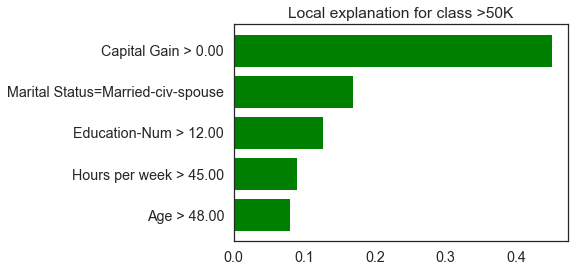

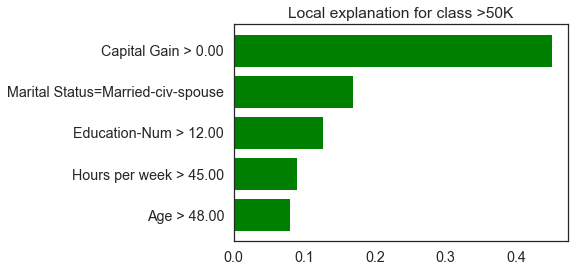

In [868]:
np.random.seed(1)
i = 1653
exp = explainer.explain_instance(test[i], predict_fn, num_features=5)
# exp.show_in_notebook(show_all=False)
exp.as_pyplot_figure()

In [869]:
# for a specific row in the classifier, what happened. 

In [ ]:
# just use the random forest params that i found with cross validation and put them into the random forest that i'm using for lime
# random forest is better at approximating a more complicated function than the other classifiers
# flexible and can learn random things separatetly
# wisdom of the crowd --> why random forest works
# can use the ones with the measures on LR and NB, as well. 

# if i want i can look at https://www.linkedin.com/pulse/random-forest-wisdom-crowds-chetan-prabhu

In [ ]:
# Jared Webbhttps://lime-ml.readthedocs.io/en/latest/lime.html#module-lime.lime_tabular
# 9:38 AMJared Webbhttps://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html
# 9:45 AMJared Webbhttps://github.com/marcotcr/lime/issues/167
# 10:21 AMJared Webbhttps://www.linkedin.com/pulse/random-forest-wisdom-crowds-chetan-prabhu

# this is all from before i talked to jared

In [574]:
x_train_rf2 = x_train_rf.copy().astype(int)
x_test_rf2 = x_test_rf.copy().astype(int)

y_train_rf2 = y_train_rf.copy().astype(int)
y_test_rf2 = y_test_rf.copy().astype(int)

In [575]:
# explainer = lime.lime_tabular.LimeTabularExplainer(x_train_rf, feature_names=x_train_rf.columns, class_names=y_train_rf, discretize_continuous=True)
explainer = lime.lime_tabular.LimeTabularExplainer(x_train_rf2.values, 
                                                   feature_names=x_data.columns, 
                                                   class_names=y_train_rf2)

In [576]:
x_train_rf2.shape

(63988, 429)

In [577]:
y_train_rf2.shape

(63988, 1)

In [946]:
# i = np.random.randint(0, x_test_rf.shape[0])
# exp = explainer.explain_instance(x_test_rf[i], rf.predict_proba, num_features=x_test_rf.shape[1])

In [947]:
# tryng with catgorical features

# random forest nominal features instead of binary stuff 

In [581]:
encoder = sklearn.preprocessing.OneHotEncoder(categorical_features=x_train_rf2.columns)

In [601]:
for i in x_train_rf.values:
    print(type(i)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 0. 0. 0. 0. 0. 1. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1.
 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 1. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.




[0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0

KeyboardInterrupt: 

In [597]:
x_train_rf2.dtypes()

TypeError: 'Series' object is not callable

In [590]:
encoder.fit(x_train_rf2)

IndexError: arrays used as indices must be of integer (or boolean) type

In [582]:
encoded_train = encoder.transform(x_train_rf2)

IndexError: arrays used as indices must be of integer (or boolean) type

In [706]:
x_train_rf =x_train_rf.iloc[:,55:].astype(int)

In [ ]:
# might be something to do with everything already being binary. could try creating a dummy dataframewith strings
# concatenate the column name before the number. then pass that through. b

In [1024]:
rf = sklearn.ensemble.RandomForestClassifier(n_estimators=10)
rf.fit(x_train_rf2, y_train_rf)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

In [1025]:
predict_fn =  rf.predict_proba(x_test_rf2)

In [1030]:
sklearn.metrics.accuracy_score(y_test_rf.iloc[:,0], rf.predict(x_test_rf2))

0.9629375

In [761]:
for name in x_train_kfolds.columns:
    print(name)

Tuberculosis
Immuniz/scrn
AcuteMI
Coronathero
Chestpain
Pulmhartdx
Othheartdx
Conduction
Dysrhythmia
Cardiaarrst
chf;nonhp
AcuteCVD
Hd/nckcancr
Precereoccl
OtherCVD
TIA
LateeffCVD
Peripathero
Aneurysm
Artembolism
Otcirculdx
Phlebitis
Varicosevn
Esophcancer
Hemmorhoids
Othveindx
Pneumonia
Influenza
Tonsillitis
Bronchitis
Otuprspin
COPD
Asthma
Asppneumon
Stomchcancr
Pleurisy
Adltrespfl
Lungexternl
Othlowresp
Otupprresp
Intestinfct
Teethdx
Mouthdx
Esophgealdx
Gasduoulcer
Coloncancer
Gastritis
Otdxstomch
Appendicitis
Abdomhernia
Ulceratcol
Intobstruct
Diverticulos
Anal/rectal
Peritonitis
Biliarydx
Rctm/anusca
Othliverdx
Pancreasdx
GIhemorrhag
Gastroent
OtherGIdx
Nephritis
Acrenlfail
Chrrenfail
UTI
Liver/ibdca
Urinstone
Otdxkidney
Otdxbladdr
OtherGUdx
BPH
Infmalegen
Othmalegen
Breastdx
PID
Endometrios
Pancreascan
Prolapse
Menstrualdx
Ovariancyst
Menopausldx
Feminfertil
Otfemalgen
Contraceptiv
Spontabortn
Inducabortn
Abortcompl
GI/peritcan
Ectopicpreg
Otpregcomp
Hemorrpreg
HTNinpreg
Earlylab

In [763]:
x_train_kfolds.shape

(71988, 429)

In [1032]:
explainer = lime.lime_tabular.LimeTabularExplainer(x_train_kfolds, class_names=[0, 1], feature_names =x_train_kfolds.columns,
                                                   categorical_features=[], categorical_names= x_train_kfolds.columns, kernel_width=3, verbose=False)

ValueError: The truth value of a Index is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [1055]:
## i = 137
exp = explainer.explain_instance(y_test_kfolds, predict_fn, num_features=5)
exp.show_in_notebook()

KeyError: 0

In [966]:
# when make a decission tree, to have a leaf node that has a class, whatever path leads to that answer has at least five example
rf2 = sklearn.ensemble.RandomForestClassifier(n_estimators=500, oob_score=True, criterion='entropy', n_jobs=-1, min_samples_leaf=5)
rf2.fit(x_train_rf2, y_train_rf2)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='entropy',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=5, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=500, n_jobs=-1,
            oob_score=True, random_state=None, verbose=0, warm_start=False)

In [967]:
pred = rf2.predict(x_test_rf2)

In [968]:
sklearn.metrics.f1_score(y_test_rf2, pred, average='binary')

0.0

In [753]:
# print((x_test_rf.iloc[:,55:] != 0.) & (x_test_rf.iloc[:,55:] != 1.)).any()


In [ ]:
# say all columns and features are categorical 

In [953]:
from collections import *

In [957]:
pred.shape

(16000, 2)

In [961]:
Counter(pred)

Counter({0: 15993, 1: 7})

In [962]:
Counter(y_test_rf2)

Counter({0: 15413, 1: 587})